In [43]:
import os
import mlflow
import numpy as np
import pandas as pd

from math import sqrt
from joblib import delayed
from joblib import Parallel

from warnings import catch_warnings
from warnings import filterwarnings
from multiprocessing import cpu_count
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.statespace.sarimax import SARIMAX

import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from matplotlib import pyplot
import matplotlib.dates as mdates

from pathlib import Path
from functools import reduce
from datetime import datetime

import random
from scipy.stats import ttest_ind
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression, RidgeCV, Ridge, LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from regressors import stats
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

## Load data 

In [44]:
df = pd.read_csv('./non_crisis_sarimax.csv', converters={'ags2': str, 'ags5': str} )
df['ags5'] = np.where(df.ags5.str.len() ==4, '0' + df['ags5'], df['ags5']) # fix ags5 missing 0 

df['error'] = df['ground_truth'] - df['pred']
df['error_sq']=df['error']**2
df['error_abs']=np.absolute(df['error'])
np.mean(df["error_abs"]/df['ground_truth'])

0.025935382928004926

In [41]:
df = pd.read_csv('./non_crisis_var_pca.csv', converters={'ags2': str, 'ags5': str} )
df['ags5'] = np.where(df.ags5.str.len() ==4, '0' + df['ags5'], df['ags5']) # fix ags5 missing 0 

df['error'] = df['ground_truth'] - df['pred']
df['error_sq']=df['error']**2
df['error_abs']=np.absolute(df['error'])
np.mean(df["error_abs"]/df['ground_truth'])

0.02738431211546993

In [9]:
np.std(df_mean["error"]/df_mean["ground_truth"]) 

0.00955672348755889

In [95]:
df2 = pd.read_csv('./../../data/final_dfs/for_modeling/df_final_stationery.csv', converters={'ags2': str, 'ags5': str} )
#df2 = df2[['ags2', 'kreis','ags5','cluster']]
# fix ags5 missing 0 
df2['ags5'] = np.where(df2.ags5.str.len() ==4, '0' + df2['ags5'], df2['ags5'])
df = pd.merge(df, df2, left_on = 'ags5', right_on = 'ags5')
df

,ags5,date,ground_truth,pred,error,cluster,kreis,ags2,supermarkets_population,supermarkets_average_distance,...,room_type_location,district_settlement_structure,type_of_settlement_structure,urban_/_rural,metropolitan_region,metropolitan_area,east_west,border_proximity,support_area_status,eligible_area
0,01001,2018-01-31,9.3,9.028416,0.271584,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
1,01001,2018-02-28,9.2,9.031855,0.168145,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
2,01001,2018-03-31,9.1,8.909250,0.190750,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
3,01001,2018-04-30,8.8,8.975852,-0.175852,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
4,01001,2018-05-31,8.3,8.727940,-0.427940,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9619,16077,2019-08-31,7.0,7.006511,-0.006511,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1
9620,16077,2019-09-30,6.5,6.842809,-0.342809,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1
9621,16077,2019-10-31,6.5,6.451817,0.048183,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1
9622,16077,2019-11-30,6.3,6.456085,-0.156085,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1


In [92]:
df.to_csv('./../../data/error_VAR_with_str.csv')

In [101]:
np.std(df["error"]/df["ground_truth"]) 

0.03418038025714568

## Plot ground truth vs pred

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23]),
 [Text(0, 0, '2018-01'),
  Text(1, 0, '2018-02'),
  Text(2, 0, '2018-03'),
  Text(3, 0, '2018-04'),
  Text(4, 0, '2018-05'),
  Text(5, 0, '2018-06'),
  Text(6, 0, '2018-07'),
  Text(7, 0, '2018-08'),
  Text(8, 0, '2018-09'),
  Text(9, 0, '2018-10'),
  Text(10, 0, '2018-11'),
  Text(11, 0, '2018-12'),
  Text(12, 0, '2019-01'),
  Text(13, 0, '2019-02'),
  Text(14, 0, '2019-03'),
  Text(15, 0, '2019-04'),
  Text(16, 0, '2019-05'),
  Text(17, 0, '2019-06'),
  Text(18, 0, '2019-07'),
  Text(19, 0, '2019-08'),
  Text(20, 0, '2019-09'),
  Text(21, 0, '2019-10'),
  Text(22, 0, '2019-11'),
  Text(23, 0, '2019-12')])

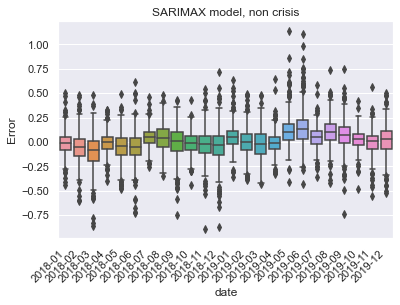

In [93]:
df['date'] = df['date'].dt.strftime('%Y-%m')
ax = sns.boxplot(x="date", y="error", data=df)
ax.set_title("SARIMAX model, non crisis")
ax.set_ylabel("Error")
plt.xticks(rotation=45, ha='right')



In [85]:
df['hm'] = df.groupby(['ags5']).cumcount()+1; df
df['hm'] = (df['hm'] + 2)% 3
df

,ags5,date,ground_truth,pred,error,cluster,kreis,ags2,supermarkets_population,supermarkets_average_distance,...,district_settlement_structure,type_of_settlement_structure,urban_/_rural,metropolitan_region,metropolitan_area,east_west,border_proximity,support_area_status,eligible_area,hm
0,01001,2018-01,9.3,9.028416,0.271584,0,"Flensburg, Stadt",01,92,500,...,4,3,2,99,99,1,1,C,1,0
1,01001,2018-02,9.2,9.031855,0.168145,0,"Flensburg, Stadt",01,92,500,...,4,3,2,99,99,1,1,C,1,1
2,01001,2018-03,9.1,8.909250,0.190750,0,"Flensburg, Stadt",01,92,500,...,4,3,2,99,99,1,1,C,1,2
3,01001,2018-04,8.8,8.975852,-0.175852,0,"Flensburg, Stadt",01,92,500,...,4,3,2,99,99,1,1,C,1,0
4,01001,2018-05,8.3,8.727940,-0.427940,0,"Flensburg, Stadt",01,92,500,...,4,3,2,99,99,1,1,C,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9619,16077,2019-08,7.0,7.006511,-0.006511,0,Altenburger Land,16,62,1458,...,3,2,2,7,99,2,0,C*,1,1
9620,16077,2019-09,6.5,6.842809,-0.342809,0,Altenburger Land,16,62,1458,...,3,2,2,7,99,2,0,C*,1,2
9621,16077,2019-10,6.5,6.451817,0.048183,0,Altenburger Land,16,62,1458,...,3,2,2,7,99,2,0,C*,1,0
9622,16077,2019-11,6.3,6.456085,-0.156085,0,Altenburger Land,16,62,1458,...,3,2,2,7,99,2,0,C*,1,1


[Text(0, 0, 'first'), Text(1, 0, 'second'), Text(2, 0, 'third')]

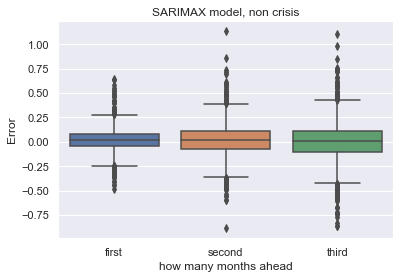

In [87]:
ax = sns.boxplot(x="hm", y="error", data=df)
ax.set_title("SARIMAX model, non crisis")
ax.set_ylabel("Error")
labels = [item.get_text() for item in ax.get_xticklabels()]
labels[0] = 'first'
labels[1] = 'second'
labels[2] = 'third'
ax.set_xlabel("how many months ahead")

ax.set_xticklabels(labels)


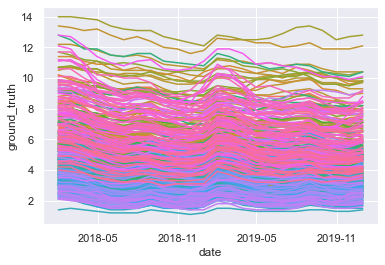

In [6]:
g = sns.lineplot(data=df, x="date", y="ground_truth",  hue="ags5")
g.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
g.legend_.remove()

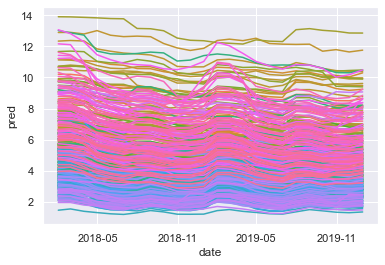

In [7]:
g = sns.lineplot(data=df, x="date", y="pred",  hue="ags5")
g.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
g.legend_.remove()

## Look into mean errors


In [8]:
df_mean = df.groupby(['date']).mean()
df_mean  

,ground_truth,pred,error,cluster,supermarkets_population,supermarkets_average_distance,public_transport_availability,average_distance_bus_stop,average_distance_train_station,average_distance_public_transport,...,settlement_structure_type_of_labor_market_region,room_type_location,district_settlement_structure,type_of_settlement_structure,urban_/_rural,metropolitan_region,metropolitan_area,east_west,border_proximity,eligible_area
date,,,,,,,,,,,,,,,,,,,,,
2018-01-31,5.499252,5.510436,-0.011184,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,446.850374,...,1.715711,2.154613,2.593516,2.054863,1.506234,55.32419,78.0399,1.19202,0.38404,0.42394
2018-02-28,5.448130,5.497417,-0.049288,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,446.850374,...,1.715711,2.154613,2.593516,2.054863,1.506234,55.32419,78.0399,1.19202,0.38404,0.42394
2018-03-31,5.224688,5.323786,-0.099098,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,446.850374,...,1.715711,2.154613,2.593516,2.054863,1.506234,55.32419,78.0399,1.19202,0.38404,0.42394
2018-04-30,5.004489,5.012116,-0.007627,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,446.850374,...,1.715711,2.154613,2.593516,2.054863,1.506234,55.32419,78.0399,1.19202,0.38404,0.42394
2018-05-31,4.787531,4.837069,-0.049537,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,446.850374,...,1.715711,2.154613,2.593516,2.054863,1.506234,55.32419,78.0399,1.19202,0.38404,0.42394
2018-06-30,4.698753,4.754955,-0.056202,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,446.850374,...,1.715711,2.154613,2.593516,2.054863,1.506234,55.32419,78.0399,1.19202,0.38404,0.42394
2018-07-31,4.814214,4.768291,0.045924,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,446.850374,...,1.715711,2.154613,2.593516,2.054863,1.506234,55.32419,78.0399,1.19202,0.38404,0.42394
2018-08-31,4.866334,4.824301,0.042034,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,446.850374,...,1.715711,2.154613,2.593516,2.054863,1.506234,55.32419,78.0399,1.19202,0.38404,0.42394
2018-09-30,4.658105,4.665392,-0.007288,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,446.850374,...,1.715711,2.154613,2.593516,2.054863,1.506234,55.32419,78.0399,1.19202,0.38404,0.42394


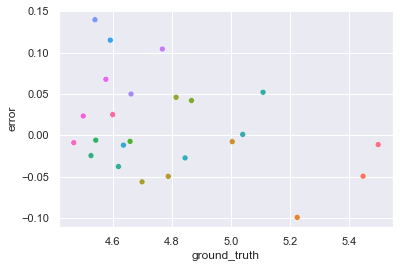

In [10]:
g = sns.scatterplot(data=df_mean, x="ground_truth", y="error",  hue="date")
g.legend_.remove()

In [11]:
df_mean["urban_/_rural"] = np.where(df_mean["urban_/_rural"]==1, 'urban', 'rural')
df_mean['eligible_area'] = np.where(df_mean['eligible_area']==1, 'eligible_area', 'not_eligible_area')
df_mean['east_west'] = np.where(df_mean['east_west']==1, 'west', 'east')
df_mean = df_mean.rename(columns={'urban_/_rural': 'urban_rural'})
df_mean = df_mean.reset_index()
df_mean

,date,ground_truth,pred,error,cluster,supermarkets_population,supermarkets_average_distance,public_transport_availability,average_distance_bus_stop,average_distance_train_station,...,settlement_structure_type_of_labor_market_region,room_type_location,district_settlement_structure,type_of_settlement_structure,urban_rural,metropolitan_region,metropolitan_area,east_west,border_proximity,eligible_area
0,2018-01-31,5.499252,5.510436,-0.011184,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,...,1.715711,2.154613,2.593516,2.054863,rural,55.32419,78.0399,east,0.38404,not_eligible_area
1,2018-02-28,5.448130,5.497417,-0.049288,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,...,1.715711,2.154613,2.593516,2.054863,rural,55.32419,78.0399,east,0.38404,not_eligible_area
2,2018-03-31,5.224688,5.323786,-0.099098,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,...,1.715711,2.154613,2.593516,2.054863,rural,55.32419,78.0399,east,0.38404,not_eligible_area
3,2018-04-30,5.004489,5.012116,-0.007627,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,...,1.715711,2.154613,2.593516,2.054863,rural,55.32419,78.0399,east,0.38404,not_eligible_area
4,2018-05-31,4.787531,4.837069,-0.049537,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,...,1.715711,2.154613,2.593516,2.054863,rural,55.32419,78.0399,east,0.38404,not_eligible_area
5,2018-06-30,4.698753,4.754955,-0.056202,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,...,1.715711,2.154613,2.593516,2.054863,rural,55.32419,78.0399,east,0.38404,not_eligible_area
6,2018-07-31,4.814214,4.768291,0.045924,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,...,1.715711,2.154613,2.593516,2.054863,rural,55.32419,78.0399,east,0.38404,not_eligible_area
7,2018-08-31,4.866334,4.824301,0.042034,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,...,1.715711,2.154613,2.593516,2.054863,rural,55.32419,78.0399,east,0.38404,not_eligible_area
8,2018-09-30,4.658105,4.665392,-0.007288,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,...,1.715711,2.154613,2.593516,2.054863,rural,55.32419,78.0399,east,0.38404,not_eligible_area
9,2018-10-31,4.541895,4.547721,-0.005826,0.339152,69.279302,1137.895262,40.326683,476.802993,2710.591022,...,1.715711,2.154613,2.593516,2.054863,rural,55.32419,78.0399,east,0.38404,not_eligible_area


,ags5,date,ground_truth,pred,error,cluster,kreis,ags2,supermarkets_population,supermarkets_average_distance,...,room_type_location,district_settlement_structure,type_of_settlement_structure,urban_/_rural,metropolitan_region,metropolitan_area,east_west,border_proximity,support_area_status,eligible_area
0,01001,2018-01,9.3,9.028416,0.271584,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
1,01001,2018-02,9.2,9.031855,0.168145,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
2,01001,2018-03,9.1,8.909250,0.190750,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
3,01001,2018-04,8.8,8.975852,-0.175852,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
4,01001,2018-05,8.3,8.727940,-0.427940,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9619,16077,2019-08,7.0,7.006511,-0.006511,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1
9620,16077,2019-09,6.5,6.842809,-0.342809,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1
9621,16077,2019-10,6.5,6.451817,0.048183,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1
9622,16077,2019-11,6.3,6.456085,-0.156085,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1


<AxesSubplot:xlabel='ags2', ylabel='error'>

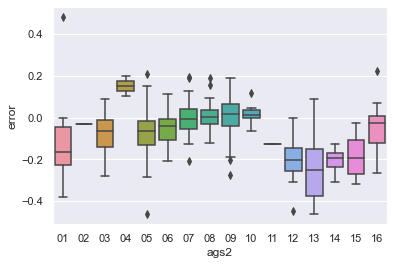

In [347]:
sns.boxplot(x="ags2", y="error", data=df_mean)

In [348]:
df_all_kreis = df
df_all_kreis = df_all_kreis[['date','ags5','2019_population', 'pred','ground_truth']]
df_all_kreis['pred'] = df_all_kreis['pred']*df_all_kreis['2019_population']
df_all_kreis['ground_truth'] = df_all_kreis['ground_truth']*df_all_kreis['2019_population']
df_all_kreis = df_all_kreis.groupby(['date']).sum()
df_all_kreis['pred'] = df_all_kreis['pred']/df_all_kreis['2019_population']
df_all_kreis['ground_truth'] = df_all_kreis['ground_truth']/df_all_kreis['2019_population']
df_all_kreis = df_all_kreis[['ground_truth','pred']]
df_all_kreis['date'] = df_all_kreis.index
df_all_kreis['date'] = pd.to_datetime(df_all_kreis['date'], format = '%Y-%m-%d')
df_all_kreis['error'] = (df_all_kreis['ground_truth'] - df_all_kreis['pred'])/ df_all_kreis['pred']

<ipython-input-348-c797e4a87de5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_kreis['pred'] = df_all_kreis['pred']*df_all_kreis['2019_population']
<ipython-input-348-c797e4a87de5>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_kreis['ground_truth'] = df_all_kreis['ground_truth']*df_all_kreis['2019_population']


Text(0.5, 1.0, 'errors all Kreise')

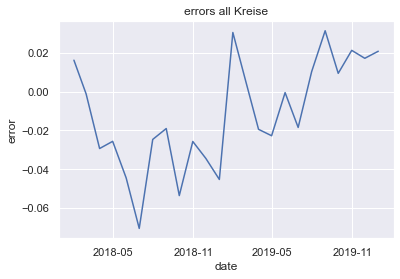

In [349]:
g = sns.lineplot(data=df_all_kreis, x="date", y="error")
g.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
g.set_title('errors all Kreise')

### Sequential Feature Selector


In [350]:
df_mean['east_west'] = df_mean['east_west'].astype(str)
df_mean['eligible_area'] =df_mean['eligible_area'].astype(str)
df_mean['cluster'] = df_mean['cluster'].astype(str)
df_mean['urban_rural'] = df_mean['urban_rural'].astype(str)

X = df_mean.drop(['kreis','pred','error','ground_truth','Unnamed:_0'], axis=1)
Y = np.log(df_mean['error'])

X = pd.get_dummies(data=X, drop_first=True)

regr = LinearRegression()
sfs1 = sfs(regr, k_features = 10,forward=True, floating=False, scoring='r2', cv=5)
sfs1.fit(X, Y)

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/v

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/p

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/p

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [351]:
summary_table_select = pd.DataFrame.from_dict(sfs1.get_metric_dict()).T
summary_table_select

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(0,)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population,)",NaN,NaN,NaN
2,"(0, 1)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
3,"(0, 1, 2)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
4,"(0, 1, 2, 3)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
5,"(0, 1, 2, 3, 4)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
6,"(0, 1, 2, 3, 4, 5)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
7,"(0, 1, 2, 3, 4, 5, 6)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
8,"(0, 1, 2, 3, 4, 5, 6, 7)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
9,"(0, 1, 2, 3, 4, 5, 6, 7, 8)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
10,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN


In [352]:
list(summary_table_select['feature_names'])[:5]

[('supermarkets_population',),
 ('supermarkets_population', 'supermarkets_average_distance'),
 ('supermarkets_population',
  'supermarkets_average_distance',
  'public_transport_availability'),
 ('supermarkets_population',
  'supermarkets_average_distance',
  'public_transport_availability',
  'average_distance_bus_stop'),
 ('supermarkets_population',
  'supermarkets_average_distance',
  'public_transport_availability',
  'average_distance_bus_stop',
  'average_distance_train_station')]

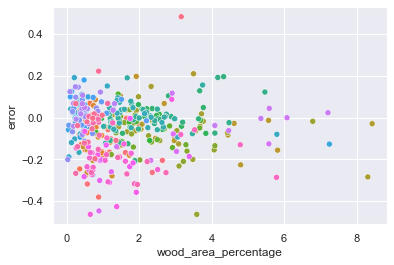

In [353]:
g = sns.scatterplot(data=df_mean, x="wood_area_percentage", y="error",  hue="ags5")
g.legend_.remove()

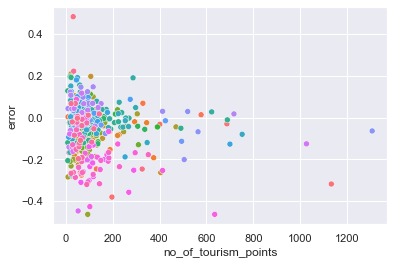

In [354]:
g = sns.scatterplot(data=df_mean, x="no_of_tourism_points", y="error",  hue="ags5")
g.legend_.remove()

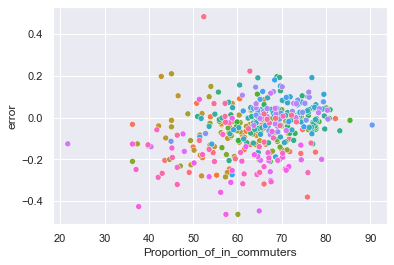

In [355]:
g = sns.scatterplot(data=df_mean, x="Proportion_of_in_commuters", y="error",  hue="ags5")
g.legend_.remove()

<AxesSubplot:xlabel='border_proximity', ylabel='error'>

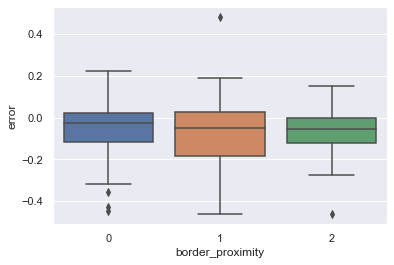

In [356]:
g = sns.boxplot(data=df_mean, x="border_proximity", y="error")
g